In [2]:
import pandas as pd
import numpy as np
import folium
from folium import plugins

## eGRID

In [3]:
df_egrid = pd.read_excel("./datafiles/egrid2020_data.xlsx", sheet_name = 'PLNT20' ,header=1)
df_egrid = df_egrid[df_egrid.PSTATABB == 'WA']
print(df_egrid.shape)
print(df_egrid.columns)
df_egrid.head()

(164, 140)
Index(['SEQPLT20', 'YEAR', 'PSTATABB', 'PNAME', 'ORISPL', 'OPRNAME', 'OPRCODE',
       'UTLSRVNM', 'UTLSRVID', 'SECTOR',
       ...
       'PLWIPR', 'PLSOPR', 'PLGTPR', 'PLOFPR', 'PLOPPR', 'PLTNPR', 'PLTRPR',
       'PLTHPR', 'PLCYPR', 'PLCNPR'],
      dtype='object', length=140)


,SEQPLT20,YEAR,PSTATABB,PNAME,ORISPL,OPRNAME,OPRCODE,UTLSRVNM,UTLSRVID,SECTOR,...,PLWIPR,PLSOPR,PLGTPR,PLOFPR,PLOPPR,PLTNPR,PLTRPR,PLTHPR,PLCYPR,PLCNPR
12146,12147,2020,WA,Adams Nielson Solar,61933,Avista Corp,20169,"Adams Nielson Solar, LLC",61529,IPP Non-CHP,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0
12147,12148,2020,WA,Alder,3913,City of Tacoma - (WA),18429,City of Tacoma - (WA),18429,Electric Utility,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
12148,12149,2020,WA,Arlington Microgrid,64446,PUD 1 of Snohomish County,17470,PUD 1 of Snohomish County,17470,Electric Utility,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12149,12150,2020,WA,Big Horn Wind II,57319,Bonneville Power Administration,1738,Avangrid Renewables LLC,15399,IPP Non-CHP,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0
12150,12151,2020,WA,Big Horn Wind Project,56361,Bonneville Power Administration,1738,Avangrid Renewables LLC,15399,IPP Non-CHP,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0


In [4]:
# LAT, LON, NUMUNT, NUMGEN, PLPRMFL, PLFUELCT, NAMEPCAP, PLNGENAN, PLGENATN, PLGENATR, PLTNPR, PLTRPR

## WSDOT AADT

In [5]:
df_aadt = pd.read_csv("./datafiles/WSDOT_Traffic_Counts_AADT.csv")
print(df_aadt.shape)
print(df_aadt.columns)
df_aadt.head()

(6882, 17)
Index(['X', 'Y', 'OBJECTID', 'LRSDate', 'RouteIdentifier', 'StateRouteNumber',
       'RelatedRouteType', 'RelatedRouteQualifier', 'AccumulatedRouteMile',
       'AADT', 'SingleUnitTruckPct', 'DoubleUnitTruckPct',
       'TripleUnitTruckPct', 'DirectionOfTravel', 'Location', 'GlobalID',
       'ReportingYear'],
      dtype='object')


,X,Y,OBJECTID,LRSDate,RouteIdentifier,StateRouteNumber,RelatedRouteType,RelatedRouteQualifier,AccumulatedRouteMile,AADT,SingleUnitTruckPct,DoubleUnitTruckPct,TripleUnitTruckPct,DirectionOfTravel,Location,GlobalID,ReportingYear
0,-122.365641,48.240274,1,2021/12/31 00:00:00+00,532,532,NaN,NaN,4.26,19000,NaN,NaN,NaN,Bothways,After Milepost 4.25 A: RIGHT INTERSECTION 98TH...,{9B3865D4-8261-4196-A946-13A1955B8AF5},2021
1,-122.253938,47.298320,2,2021/12/31 00:00:00+00,167Q101469,167,Q1,01469,0.20,3700,NaN,NaN,NaN,Northbound,On Q1 RAMP (15TH ST SW TO SR 167 NB) After RIG...,{0D9D296A-1DFD-4439-9EEA-B3584A94167F},2021
2,-118.387595,46.027572,3,2021/12/31 00:00:00+00,125,125,NaN,NaN,1.89,16000,NaN,NaN,NaN,Bothways,After Milepost 1.88 A: LEFT INTERSECTION COLLE...,{5A643190-D5CC-4A33-8322-661CEBA58B7F},2021
3,-122.541535,46.937836,4,2021/12/31 00:00:00+00,702,702,NaN,NaN,0.59,8700,4.44,2.13,0.31,Bothways,After Milepost 0.58 A: RIGHT INTERSECTION HART...,{1F772D26-2ECC-4503-9A93-365F86B75653},2021
4,-122.333841,47.545449,5,2021/12/31 00:00:00+00,099S102690,99,S1,02690,0.13,15000,NaN,NaN,NaN,Southbound,On S1 RAMP (E MARGNL WAY TO SR 99 SB) After RI...,{0E0F487B-F425-4C64-BF26-5ECA88B40456},2021


In [6]:
print('RelatedRouteType', df_aadt.RelatedRouteType.unique())
print('DirectionOfTravel', df_aadt.DirectionOfTravel.unique())

RelatedRouteType [nan 'Q1' 'S1' 'R1' 'P1' 'Q5' 'SP' 'S5' 'P5' 'LX' 'CD' 'CI' 'CO' 'R5' 'P6'
 'Q2' 'S7' 'R2' 'P2' 'RL' 'S2' 'X1' 'AR' 'HI' 'S6' 'S3' 'Q6' 'P3' 'HD'
 'R3' 'P7']
DirectionOfTravel ['Bothways' 'Northbound' 'Southbound' 'Eastbound' 'Westbound']


In [7]:
# useful columns: X, Y, AccumulatedRouteMile, AADT, SingleUnitTruckPct, DoubleUnitTruckPct, TripleUnitTruckPct, DirectionOfTravel
df_aadt['norm_AADT'] = (df_aadt.AADT-df_aadt.AADT.min())/(df_aadt.AADT.max()-df_aadt.AADT.min())

In [8]:
center = 47.7511, -120.7401
this_map = folium.Map(location=center, 
               zoom_start=7,
               width=800,height=600)

# def plotDot(point):
#     '''input: series that contains a numeric named latitude and a numeric named longitude
#     this function creates a CircleMarker and adds it to your this_map'''
#     folium.Circle(location=[point.Y, point.X],
#                     radius = float(point.norm_AADT*10000),
#                     weight = 5,
#                     popup = "lat: {0}\nlong: {1}\nAADT: {2}\nRoute Type: {3}\nDirection: {4}".format(point.Y, point.X, point.AADT, point.RelatedRouteType, point.DirectionOfTravel),
#                     color = 'crimson',
#                     fill = True,
#                     fill_color = 'crimson').add_to(this_map)

# #use df.apply(,axis=1) to "iterate" through every row in your dataframe
# df_aadt.apply(plotDot, axis = 1)

# Heatmap version
heat_data = df_aadt[['Y','X','norm_AADT']].values.tolist()
plugins.HeatMap(heat_data,radius=15).add_to(this_map)

# save interactive map to html
this_map.save('AADT_heat_map.html')

this_map

## Coordinates to Zip code converter

In [9]:
# census tract to long/lat converter
converter_coord = pd.read_table("./datafiles/2020_WA_census_tracts_FIPS.txt")
print(converter_coord.shape)
converter_coord.rename(columns={converter_coord.columns[7]:'INTPTLONG'}, inplace = True)
converter_coord.head()

(1784, 8)


,USPS,GEOID,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG
0,WA,53001950100,1612463867,7701924,622.576,2.974,47.150512,-118.398327
1,WA,53001950200,2632137474,2148452,1016.274,0.830,46.925269,-118.509265
2,WA,53001950301,431966557,0,166.783,0.000,46.827801,-119.010979
3,WA,53001950302,174575089,2213558,67.404,0.855,46.855092,-119.288159
4,WA,53001950303,118609926,400491,45.796,0.155,46.771170,-119.269181


In [10]:
# lat long to zipcode converter
from uszipcode import SearchEngine
search = SearchEngine()
import numpy as np

#define zipcode search function
def get_zipcode(lat, long):
    result = search.by_coordinates(lat = lat, lng = long, returns = 1)
    return result[0].zipcode

#load columns from dataframe
lat = converter_coord.INTPTLAT
lon = converter_coord.INTPTLONG

#define latitude/longitude for function
df = pd.DataFrame({'lat':lat, 'lon':lon})

#add new column with generated zip-code
df['zipcode'] = df.apply(lambda x: get_zipcode(lat = x.lat, long = x.lon), axis=1)

df.head()

/Users/clarissarjtai/miniforge3/lib/python3.8/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


,lat,lon,zipcode
0,47.150512,-118.398327,99169
1,46.925269,-118.509265,99341
2,46.827801,-119.010979,99344
3,46.855092,-119.288159,99344
4,46.771170,-119.269181,99344


In [11]:
converter_coord['zipcode'] = df['zipcode'] 
converter_coord.head()

,USPS,GEOID,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG,zipcode
0,WA,53001950100,1612463867,7701924,622.576,2.974,47.150512,-118.398327,99169
1,WA,53001950200,2632137474,2148452,1016.274,0.830,46.925269,-118.509265,99341
2,WA,53001950301,431966557,0,166.783,0.000,46.827801,-119.010979,99344
3,WA,53001950302,174575089,2213558,67.404,0.855,46.855092,-119.288159,99344
4,WA,53001950303,118609926,400491,45.796,0.155,46.771170,-119.269181,99344


In [12]:
print(converter_coord.shape)

(1784, 9)


In [13]:
# create new map instance
center = 47.7511, -120.7401
this_map = folium.Map(location=center, 
               zoom_start=7,
               width=800,height=600)

# scatter plot version
def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.Circle(location=[point.Y, point.X],
                    radius = float(point.norm_AADT*10000),
                    weight = 5,
                    popup = "lat: {0}\nlong: {1}\nAADT: {2}\nRoute Type: {3}\nDirection: {4}".format(point.Y, point.X, point.AADT, point.RelatedRouteType, point.DirectionOfTravel),
                    color = 'crimson',
                    fill = True,
                    fill_color = 'crimson').add_to(this_map)

#use df.apply(,axis=1) to "iterate" through every row in your dataframe
df_aadt.apply(plotDot, axis = 1)

# Heatmap version
heat_data = df_aadt[['Y','X','norm_AADT']].values.tolist()
plugins.HeatMap(heat_data,radius=15).add_to(this_map)

# save interactive map to html
this_map.save('AADT_heat_map.html')

# show the map
this_map

## National Risk Index for Natural Hazards
Washington's most common natural disasters include wildfires(WFIR), floods(CFLD: Coastal Flooding, RFLD: Riverine Flooding), severe storms(HRCN: Hurricane), landslides(LNDS), earthquakes(ERQK), tsunamis(TSUN), droughts(DRGT), and volcanoes(VLCN). Other less significant disasters include power outages, winter storms(CWAV: Cold Wave, WNTW: winter weather, ISTM: ice storm, HAIL: Hail, AVLN:Avalanche), and tornadoes(TRND). HWAV: Heat Wave


EAL: [Expected Annual Loss](https://hazards.fema.gov/nri/expected-annual-loss)

Expected Annual Loss (EAL) represents the average economic loss in dollars resulting from natural hazards each year. It is calculated for each hazard type and quantifies loss for relevant consequence types: buildings, people, and agriculture.

SOVI: [Social Vulnerability](https://hazards.fema.gov/nri/social-vulnerability) (Min-max normalized)

Social vulnerability is the susceptibility of social groups to the adverse impacts of natural hazards, including disproportionate death, injury, loss, or disruption of livelihood.

RESL: [Community Resilience](https://hazards.fema.gov/nri/community-resilience)

Community resilience is the ability of a community to prepare for anticipated natural hazards, adapt to changing conditions, and withstand and recover rapidly from disruptions.


### How NRI is calculated?
https://hazards.fema.gov/nri/determining-risk

Expected Annual Loss * Social Vulnerability / Community Resilience = Risk Index

In [14]:
df_nri = pd.read_csv("./datafiles/NRI_CensusTracts_WA/NRI_Table_CensusTracts_Washington.csv")
nri_dir = pd.read_csv("./datafiles/NRI_CensusTracts_WA/NRIDataDictionary.csv")
nri_hazard_info = pd.read_csv("./datafiles/NRI_CensusTracts_WA/NRI_HazardInfo.csv")

In [15]:
print(df_nri.shape)
print(df_nri.columns)
df_nri.head()

(1446, 367)
Index(['OID_', 'NRI_ID', 'STATE', 'STATEABBRV', 'STATEFIPS', 'COUNTY',
       'COUNTYTYPE', 'COUNTYFIPS', 'STCOFIPS', 'TRACT',
       ...
       'WNTW_EALB', 'WNTW_EALP', 'WNTW_EALPE', 'WNTW_EALA', 'WNTW_EALT',
       'WNTW_EALS', 'WNTW_EALR', 'WNTW_RISKS', 'WNTW_RISKR', 'NRI_VER'],
      dtype='object', length=367)


,OID_,NRI_ID,STATE,STATEABBRV,STATEFIPS,COUNTY,COUNTYTYPE,COUNTYFIPS,STCOFIPS,TRACT,...,WNTW_EALB,WNTW_EALP,WNTW_EALPE,WNTW_EALA,WNTW_EALT,WNTW_EALS,WNTW_EALR,WNTW_RISKS,WNTW_RISKR,NRI_VER
0,30470,T53049950200,Washington,WA,53,Pacific,County,49,53049,950200,...,79.899664,0.000112,853.058140,33.247888,966.205692,15.736898,Relatively Low,11.035544,Relatively Moderate,November 2021
1,30601,T53049950500,Washington,WA,53,Pacific,County,49,53049,950500,...,23.892830,0.000018,138.953303,0.591076,163.437208,8.703212,Relatively Low,5.517714,Relatively Low,November 2021
2,30885,T53033032800,Washington,WA,53,King,County,33,53033,32800,...,0.694378,0.000016,123.054600,479.184395,602.933373,13.447835,Relatively Low,6.429770,Relatively Low,November 2021
3,30924,T53033031501,Washington,WA,53,King,County,33,53033,31501,...,0.109565,0.000004,31.788992,19.685609,51.584165,5.925633,Very Low,3.098243,Very Low,November 2021
4,30949,T53033032007,Washington,WA,53,King,County,33,53033,32007,...,0.079396,0.000003,22.674252,0.298783,23.052431,4.530382,Very Low,2.086950,Very Low,November 2021


In [16]:
#add new column with generated zip-code
df_nri = df_nri.merge(converter_coord[['GEOID','INTPTLAT','INTPTLONG','zipcode']], how='left', left_on='TRACTFIPS', right_on='GEOID')
print(df_nri.shape)
df_nri.head()

(1446, 371)


,OID_,NRI_ID,STATE,STATEABBRV,STATEFIPS,COUNTY,COUNTYTYPE,COUNTYFIPS,STCOFIPS,TRACT,...,WNTW_EALT,WNTW_EALS,WNTW_EALR,WNTW_RISKS,WNTW_RISKR,NRI_VER,GEOID,INTPTLAT,INTPTLONG,zipcode
0,30470,T53049950200,Washington,WA,53,Pacific,County,49,53049,950200,...,966.205692,15.736898,Relatively Low,11.035544,Relatively Moderate,November 2021,5.304995e+10,46.744007,-123.682527,98577
1,30601,T53049950500,Washington,WA,53,Pacific,County,49,53049,950500,...,163.437208,8.703212,Relatively Low,5.517714,Relatively Low,November 2021,NaN,NaN,NaN,NaN
2,30885,T53033032800,Washington,WA,53,King,County,33,53033,32800,...,602.933373,13.447835,Relatively Low,6.429770,Relatively Low,November 2021,5.303303e+10,47.653074,-121.431277,98251
3,30924,T53033031501,Washington,WA,53,King,County,33,53033,31501,...,51.584165,5.925633,Very Low,3.098243,Very Low,November 2021,5.303303e+10,47.320380,-121.879143,98051
4,30949,T53033032007,Washington,WA,53,King,County,33,53033,32007,...,23.052431,4.530382,Very Low,2.086950,Very Low,November 2021,5.303303e+10,47.391163,-122.073658,98042


In [17]:
df_nri.iloc[:,15:37].describe()

,RISK_SCORE,RISK_NPCTL,RISK_SPCTL,EAL_SCORE,EAL_NPCTL,EAL_SPCTL,EAL_VALT,EAL_VALB,EAL_VALP,EAL_VALPE,EAL_VALA,SOVI_SCORE,SOVI_NPCTL,SOVI_SPCTL,SOVI_VALUE,RESL_SCORE,RESL_NPCTL,RESL_SPCTL
count,1445.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1.446000e+03,1.446000e+03,1446.000000,1.446000e+03,1.446000e+03,1445.000000,1446.000000,1446.000000,1445.000000,1446.000000,1446.000000,1446.000000
mean,25.512074,80.444001,50.034578,27.586584,81.516695,50.034578,1.353679e+06,4.525074e+05,0.117253,8.911228e+05,1.004903e+04,31.126833,44.270034,50.452409,-0.479457,53.838370,40.317789,67.227010
std,8.055628,19.759318,28.877494,8.256724,20.633786,28.877494,1.413291e+06,6.455775e+05,0.142671,1.084302e+06,6.261297e+04,4.047237,28.438054,28.640205,2.530858,1.013410,11.399638,20.017639
min,4.555344,0.401435,0.069156,6.725060,0.929350,0.069156,1.530912e+04,5.029647e+02,0.000000,0.000000e+00,0.000000e+00,11.421170,0.901431,0.891632,-12.802000,49.776602,4.867961,2.564103
25%,20.163938,72.081689,25.051867,21.699871,73.740016,25.051867,5.143203e+05,2.023068e+05,0.024762,1.881907e+05,9.162787e-02,28.647274,19.673146,25.685871,-2.030000,53.560200,36.461979,58.974359
50%,25.513910,88.376937,50.034578,27.650849,90.201268,50.034578,1.064112e+06,3.428410e+05,0.082321,6.256426e+05,2.908341e+00,30.967649,40.679972,50.445816,-0.579000,53.943200,41.202673,69.230769
75%,30.401223,95.268013,75.017289,33.506734,96.624919,75.017289,1.893469e+06,4.956256e+05,0.197836,1.503553e+06,1.420964e+02,33.443142,67.935258,75.222908,0.969000,54.714398,50.652243,84.615385
max,83.400899,99.989002,100.000000,74.096559,99.979378,100.000000,2.047652e+07,1.085242e+07,2.526135,1.919862e+07,1.031692e+06,54.385684,99.792083,100.000000,14.065000,56.660600,73.592109,100.000000


Why are some data missing for my county or Census tract?
All data supporting National Risk Index risk components were required to be nationwide in scope and able to be measured at the Census tract level. Hazard type data sources were also required to have location and time information. For some counties and Census tracts, data that met these requirements were simply not available.

The National Risk Index uses specific ratings to communicate if a community is missing data:

Not Applicable indicates there is no historical record in the National Risk Index source data for a hazard type and the hazard type is not geographically possible ( i.e., Coastal Flooding in inland areas). Therefore, there is no perceived probability of the hazard impacting a community.
Insufficient Data indicates that one or more required components for a calculation are not available.
Data Unavailable indicates source data are not available for an National Risk Index component. This is specific to Social Vulnerability and Community Resilience only.
No Rating indicates there is an National Risk Index component with a score of 0, and the Risk Index score cannot be calculated for that hazard or community.
No Expected Annual Losses indicates one of the Expected Annual Loss factors has a value of 0 and Expected Annual Loss cannot be calculated for a hazard type. If a community has No Expected Annual Loss for a hazard type, then the hazard type does not contribute to the composite Expected Annual Loss score for all 18 hazard types.

In [18]:
pd.unique(df_nri[df_nri.GEOID.isna()].TRACTFIPS).shape

(294,)

In [19]:
print(nri_dir.shape)
print(nri_dir.columns)
nri_dir.head()

(379, 8)
Index(['Sort', 'Field Name', 'Field Alias', 'Type', 'Length', 'Relevant Layer',
       'Metric Type', 'Version'],
      dtype='object')


,Sort,Field Name,Field Alias,Type,Length,Relevant Layer,Metric Type,Version
0,1,OBJECTID,OBJECTID,Integer,4.0,NaN,NaN,Nov-21
1,2,Shape,Shape,Geometry,NaN,NaN,NaN,Nov-21
2,3,Shape_Length,Shape_Length,Double,8.0,NaN,NaN,Nov-21
3,4,Shape_Area,Shape_Area,Double,8.0,NaN,NaN,Nov-21
4,5,STATE,State Name,String,250.0,All,NaN,Nov-21


In [20]:
print(nri_hazard_info.shape)
print(nri_hazard_info.columns)
nri_hazard_info.head()

(18, 13)
Index(['OID_', 'Hazard', 'Prefix', 'Service', 'Start', 'End_', 'TotalYears',
       'FrequencyModel', 'EAL_Building', 'EAL_Population', 'EAL_Agriculture',
       'PeriodOfRecord', 'NRI_VER'],
      dtype='object')


,OID_,Hazard,Prefix,Service,Start,End_,TotalYears,FrequencyModel,EAL_Building,EAL_Population,EAL_Agriculture,PeriodOfRecord,NRI_VER
0,1,Avalanche,AVLN,Avalanche,1960,2019.0,60,Annualized Frequency,1,1,0,1960-2019 (60 years),November 2021
1,2,Coastal Flooding,CFLD,CoastalFlooding,NaN,NaN,NaN,Annualized Frequency,1,1,0,Various (see documentation),November 2021
2,3,Cold Wave,CWAV,ColdWave,2005,2017.0,12,Annualized Frequency,1,1,1,2005-2017 (12 years),November 2021
3,4,Drought,DRGT,Drought,2000,2017.0,18,Annualized Frequency,0,0,1,2000-2017 (18 years),November 2021
4,5,Earthquake,ERQK,Earthquake,2017,2017.0,1,Probability,1,1,0,2017 dataset,November 2021


In [73]:
# define heatmap function
def plot_heatmap(df, col = ['lat','lng', 'weight'], save_html = False, filename = None):
    center = 47.3511, -120.7401
    this_map = folium.Map(location=center, 
                zoom_start=7,
                width=800,height=600)

    # Heatmap version
    heat_data = df[col].values.tolist()
    plugins.HeatMap(heat_data,radius=15).add_to(this_map)

    # save interactive map to html
    if save_html:
        this_map.save(filename)

    return this_map

## Population as of 2016

In [74]:
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'POPULATION']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'POPULATION'], save_html = False)

## Building Value ($)


In [23]:
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'BUILDVALUE']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'BUILDVALUE'], save_html = False)

## Agriculture Value ($)

In [24]:
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'AGRIVALUE']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'AGRIVALUE'], save_html = False)

In [25]:
# Area of the census tract
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'AREA']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'AREA'], save_html = False)

In [26]:
# print("Risk Rating: ",df_nri.RISK_RATNG.unique())
# print("Social Vulnerability Rating: ",df_nri.SOVI_RATNG.unique())

rating_col = df_nri.columns[df_nri.columns.str.contains('RATNG|EALR|RISKR')]
print(rating_col)
all_rate = []
for i in rating_col:
    all_rate.extend(df_nri[i].unique())
    # print(i, ": ", df_nri[i].unique())
print(set(all_rate))

Index(['RISK_RATNG', 'EAL_RATNG', 'SOVI_RATNG', 'RESL_RATNG', 'AVLN_EALR',
       'AVLN_RISKR', 'CFLD_EALR', 'CFLD_RISKR', 'CWAV_EALR', 'CWAV_RISKR',
       'DRGT_EALR', 'DRGT_RISKR', 'ERQK_EALR', 'ERQK_RISKR', 'HAIL_EALR',
       'HAIL_RISKR', 'HWAV_EALR', 'HWAV_RISKR', 'HRCN_EALR', 'HRCN_RISKR',
       'ISTM_EALR', 'ISTM_RISKR', 'LNDS_EALR', 'LNDS_RISKR', 'LTNG_EALR',
       'LTNG_RISKR', 'RFLD_EALR', 'RFLD_RISKR', 'SWND_EALR', 'SWND_RISKR',
       'TRND_EALR', 'TRND_RISKR', 'TSUN_EALR', 'TSUN_RISKR', 'VLCN_EALR',
       'VLCN_RISKR', 'WFIR_EALR', 'WFIR_RISKR', 'WNTW_EALR', 'WNTW_RISKR'],
      dtype='object')
{'No Expected Annual Losses', 'Relatively High', 'Insufficient Data', 'Not Applicable', 'Very Low', 'Relatively Low', 'Relatively Moderate', 'No Rating', 'Very High', 'Data Unavailable'}


In [27]:
# TODO: 'Insufficient Data', 'No Expected Annual Losses', 'No Rating', 'Data Unavailable', 'Not Applicable'

## Expected Annual Loss - State Percentile(EAL_SPCTL)

In [28]:
# Expected Annual Loss - State Percentile(EAL_SPCTL)
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'EAL_SPCTL']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'EAL_SPCTL'], save_html = False)

## Social Vulnerability - State Percentile

In [29]:
# Social Vulnerability - State Percentile
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'SOVI_SPCTL']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'SOVI_SPCTL'], save_html = False)

## Community Resilience - State Percentile

In [30]:
# Community Resilience - State Percentile
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'RESL_SPCTL']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'RESL_SPCTL'], save_html = False)

For each component of Natural Risk Index we have
+ SCORE: Score is constrained from 0 to 100, is achieved by min-max-scaling value across US of the community at the census tract level
+ RATNG: Rating is determined by k means clustering algo
+ NPCTL: National Percentile
+ SPCTL: State Percentile
+ VALUE: Value, initial value from data source. Some may be already standardized.

For every disaster we have the following feature:
+ EVNTS: Number of Events
+ AFREQ: Annualized Frequency
+ EXPB: Exposure - Building Value
+ EXPP: Exposure - Population
+ EXPPE: Exposure - Population Equivalence
+ EXPT: Exposure - Total
+ HLRB: Historic Loss Ratio - Buildings
+ HLRP: Historic Loss Ratio - Population
+ HLRR: Historic Loss Ratio - Total Rating
+ EALB: Expected Annual Loss - Building Value
+ EALP: Expected Annual Loss - Population
+ EALPE: Expected Annual Loss - Population Equivalence
+ EALT: Expected Annual Loss - Total (this is highly skewed by population, especially between urban and rural area)
+ EALS: Expected Annual Loss Score
+ EALR: Expected Annual Loss Rating
+ RISKS: Hazard Type Risk Index Score
+ RISKR: Hazard Type Risk Index Rating

[0, 1, 2]

In [56]:
# For each hazard type, find out the total number of events(EVNTS), score of expected annual loss(EALS), risk index score(RISKS)
df_hazard = pd.DataFrame(columns=['number of events', 'Total EAL score', 'Building EAL score', 'Risk Index Score'], index = nri_hazard_info.Hazard)
for i, prefix in enumerate(nri_hazard_info.Prefix):
    for j, suffix in enumerate(['_EVNTS', '_EALS', '_EALB', '_RISKS']):
        try:
            df_hazard.iloc[i,j] = df_nri[prefix + suffix].sum()
        except:
            df_hazard.iloc[i,j] = 0
df_hazard

,number of events,Total EAL score,Building EAL score,Risk Index Score
Hazard,,,,
Avalanche,20325.0,70408.890337,1625326.748411,44767.848974
Coastal Flooding,0.0,7290.812493,102979521.702571,6906.65283
Cold Wave,1195.0,6946.655427,18381.704619,7095.341345
Drought,35693.0,1168.704539,0,1195.097778
Earthquake,0.0,40091.771194,438524135.3,41815.212625
Hail,3768.0,5324.369664,48677.838771,5399.399055
Heat Wave,25028.0,10129.970769,406970.700833,8694.281906
Hurricane,0.0,0.0,0.0,0.0
Ice Storm,63220.0,18658.188008,403070.385233,14276.740855


array([<AxesSubplot:title={'center':'number of events'}, xlabel='Hazard'>,
       <AxesSubplot:title={'center':'Total EAL score'}, xlabel='Hazard'>,
       <AxesSubplot:title={'center':'Building EAL score'}, xlabel='Hazard'>,
       <AxesSubplot:title={'center':'Risk Index Score'}, xlabel='Hazard'>],
      dtype=object)

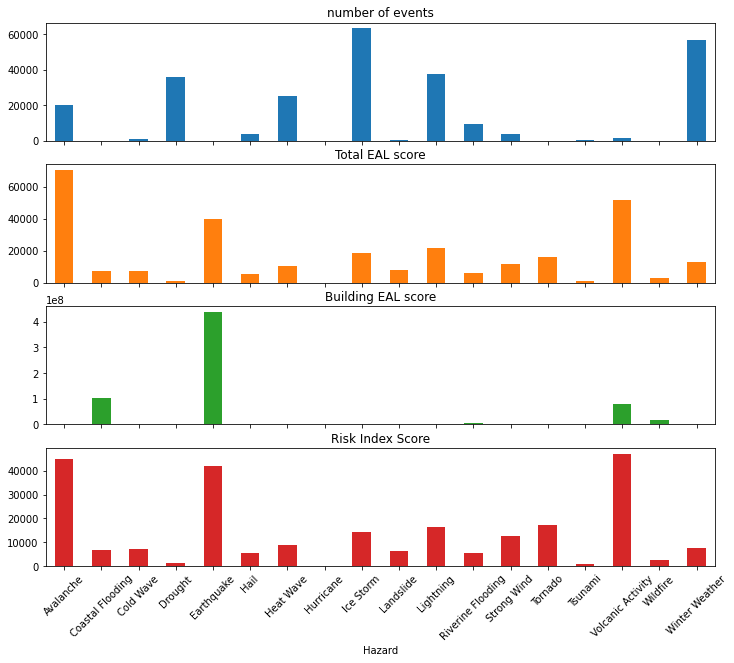

In [58]:
df_hazard.plot.bar(rot=45, subplots=True, figsize = (12, 10), legend = False)

In [67]:
print("Top 5 Natural Disaster sorted by Risk Index Score: ", list(df_hazard.sort_values(by='Risk Index Score', ascending= False).index[:5]))
print("Top 5 Natural Disaster sorted by Building EAL Score: ", list(df_hazard.sort_values(by='Building EAL score', ascending= False).index[:5]))

Top 5 Natural Disaster sorted by Risk Index Score:  ['Volcanic Activity', 'Avalanche', 'Earthquake', 'Tornado', 'Lightning']
Top 5 Natural Disaster sorted by Building EAL Score:  ['Earthquake', 'Coastal Flooding', 'Volcanic Activity', 'Wildfire', 'Riverine Flooding']


### Risk Index Score

In [68]:
# Volcanic Activity Risk Index Score
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'VLCN_RISKS']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'VLCN_RISKS'], save_html = False)

In [69]:
# Avalanche Risk Index Score
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'AVLN_RISKS']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'AVLN_RISKS'], save_html = False)

In [72]:
# Earthquake Risk Index Score
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'ERQK_RISKS']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'ERQK_RISKS'], save_html = False)

### Number of Events

In [75]:
# Volcanic Activity Number of Events
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'VLCN_EVNTS']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'VLCN_EVNTS'], save_html = False)

In [76]:
# Avalanche Number of Events
nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'AVLN_EVNTS']].dropna()
plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'AVLN_EVNTS'], save_html = False)

In [78]:
# Earthquake Number of Events - No earthquake events
# nri_temp = df_nri[['INTPTLAT', 'INTPTLONG', 'ERQK_EVNTS']].dropna()
# plot_heatmap(nri_temp, col = ['INTPTLAT', 'INTPTLONG', 'ERQK_EVNTS'], save_html = False)